# Project 2 - Ames Housing Data

## Goal:
1. Creating a regression model based on the Ames Housing Dataset that will predict the price of a house at sale.
2. Get lowest R_squared value

Kaggle leaderboard standings will be determined by root mean squared error (RMSE).


$$\text{RMSE}=\sqrt{\sum\frac{(\hat{y}i - yi)^2}{n}}$$


# 1. Import Library & datasets

In [1]:
#importing all necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn import linear_model

lr = LinearRegression()
ss = StandardScaler()

In [2]:
#Load dataset
predict_df = pd.read_csv('./datasets/test.csv')
train_df = pd.read_csv('./datasets/train.csv')

# 2. Check Dataset for any missing or abnormal data

In [3]:
#Checking the rows and columns of the dataset
print(predict_df.shape)
print(train_df.shape)

(879, 80)
(2051, 81)


From the code above it shows that the test set lacks of  1 category/ variance

In [4]:
#Expand view of collumns and rows
pd.set_option("display.max_rows", 81)
pd.set_option("display.max_columns", 81)
predict_df.head(1)

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
0,2658,902301120,190,RM,69.0,9142,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,6,8,1910,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,Fa,Stone,Fa,TA,No,Unf,0,Unf,0,1020,1020,GasA,Gd,N,FuseP,908,1020,0,1928,0,0,2,0,4,2,Fa,9,Typ,0,NaN,Detchd,1910.0,Unf,1,440,Po,Po,Y,0,60,112,0,0,0,NaN,NaN,NaN,0,4,2006,WD


In [5]:
train_df.head(0)

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice


As seen from the code above the Test_df lacks the column 'SalePrice'.
We shall input a the 0 value into that test set. Having the values all set to 0 ....

In [6]:
#Create a new column in predict_df called 'SalePrice' and fill it as 0
predict_df['SalePrice'] = 0
print(predict_df['SalePrice'])

0      0
1      0
2      0
3      0
4      0
      ..
874    0
875    0
876    0
877    0
878    0
Name: SalePrice, Length: 879, dtype: int64


In [7]:
#Checking the rows and columns of the dataset again, to confirm they have the same columns
print(predict_df.shape)
print(train_df.shape)

(879, 81)
(2051, 81)


## 2.1 Check for nan/null values 

In [8]:
#List of nan/null values based on column
train_df.isnull().sum().sort_values(ascending = False)

Pool QC            2042
Misc Feature       1986
Alley              1911
Fence              1651
Fireplace Qu       1000
Lot Frontage        330
Garage Finish       114
Garage Cond         114
Garage Qual         114
Garage Yr Blt       114
Garage Type         113
Bsmt Exposure        58
BsmtFin Type 2       56
BsmtFin Type 1       55
Bsmt Cond            55
Bsmt Qual            55
Mas Vnr Type         22
Mas Vnr Area         22
Bsmt Half Bath        2
Bsmt Full Bath        2
Garage Cars           1
Garage Area           1
Bsmt Unf SF           1
BsmtFin SF 2          1
Total Bsmt SF         1
BsmtFin SF 1          1
Overall Cond          0
Exterior 2nd          0
Exterior 1st          0
Roof Matl             0
Roof Style            0
Year Remod/Add        0
Year Built            0
SalePrice             0
Overall Qual          0
Land Contour          0
PID                   0
MS SubClass           0
MS Zoning             0
Lot Area              0
Street                0
Lot Shape       

Due to that the category has insufficient observation the entire column will be kept and be inspected thoroughly

## 2.2 Numerising Ordinal Data
Due to that there are multiple Nan values in seperated rows, we cannot use the:

train_df.dropna(how='any', inplace = True)

as this will remove too many observations/ rows

Thus, we need to remove certain least relevant categories. To do that we have to identify which columns by their categories, for nominal and ordinal

Categories:

    Ordinal:
    -Lot Shape, Utilities, Land Slope, Overall Qual, Overall Cond, Exter Qual, Exter Cond, Bsmt Qual, Bsmt Cond, Bsmt Exposure, BsmtFin Type 1, BsmtFinType 2, HeatingQC, Electrical, KitchenQual, Functional, FireplaceQu, Garage Finish, Garage Qual, Garage Cond, Paved Drive, Pool QC, Fence
    
    Nominal:
    -PID, MS Zoning, Roof Style,Roof Matl, Exterior 1, Exterior 2, Mas Vnr Type, Street, Alley, Land Contour, Lot Config, Neighborhood, Condition 1, Condition 2, Bldg Type, House Style, Foundation, Heating, Central Air, Garage Type, Misc Feature,Sale Type, Sale Condition

### Ordinal values

We shall input numerical values in 'ordinal' categories and compare in the corelation

Lot Shape

- 4        Reg	Regular	
- 3        IR1	Slightly irregular
- 2        IR2	Moderately Irregular
- 1        IR3	Irregular

Utilities

- 4        AllPub	All public Utilities (E,G,W,& S)	
- 3        NoSewr	Electricity, Gas, and Water (Septic Tank)
- 2        NoSeWa	Electricity and Gas Only
- 1        ELO	    Electricity only

Land Slope (Ordinal): Slope of property

- 3        Gtl	Gentle slope
- 2        Mod	Moderate Slope
- 1        Sev	Severe Slope
       
Overall Qual, Overall Cond

- 10       Very Excellent
- 9        Excellent
- 8        Very Good
- 7        Good	
- 6        Above Average
- 5        Average
- 4        Below Average	
- 3        Fair
- 2        Poor
- 1        Very Poor

Exter Qual, Exter Cond, Bsmt Qual, Bsmt Cond, HeatingQC, KitchenQual, FireplaceQu, Garage Qual, Garage Cond, PoolQC
	
- 5        Ex Excellent
- 4        Gd Good	
- 3        TA Average/Typical
- 2        Fa Fair
- 1        Po Poor
- 0        NA Not available
   
Bsmt Exposure

- 4        Gd Good	
- 3        Av	Average Exposure (split levels or foyers typically score average or above)
- 2        Mn	Mimimum Exposure
- 1        No	No Exposure
- 0        NA	No Basement

BsmtFin Type 1, BsmtFinType 2

- 6        GLQ	Good Living Quarters
- 5        ALQ	Average Living Quarters
- 4        BLQ	Below Average Living Quarters
- 3        Rec	Average Rec Room
- 2        LwQ	Low Quality
- 1        Unf	Unfinshed
- 0        NA	No Basement

Electrical

- 5        SBrkr	Standard Circuit Breakers & Romex
- 4        FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)
- 3        FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
- 2        FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
- 1        Mix	Mixed

Functional
       
- 8        Typ	Typical Functionality
- 7        Min1	Minor Deductions 1
- 6        Min2	Minor Deductions 2
- 5        Mod	Moderate Deductions
- 4        Maj1	Major Deductions 1	
- 3        Maj2	Major Deductions 2
- 2        Sev	Severely Damaged
- 1        Sal	Salvage only

Garage Finish
		
- 3        Fin	Finished
- 2        RFn	Rough Finished
- 1        Unf	Unfinshed
- 0        NA	No Garage

Paved Drive

- 3        Y	Paved 
- 2        P	Partial Pavement
- 1        N	Dirt/Gravel

Fence

- 4        GdPrv	Good Privacy
- 3        MnPrv	Minimum Privacy
- 2        GdWo	Good Wood
- 1        MnWw	Minimum Wood/Wire
- 0        NA	No Fence


In [9]:
#Lot Shape
train_df.replace('Reg', 4, inplace= True)
train_df.replace('IR1', 3, inplace= True)
train_df.replace('IR2', 2, inplace= True)
train_df.replace('IR3', 1, inplace= True)
#Utilities
train_df.replace('AllPub', 4, inplace= True)
train_df.replace('NoSewr', 3, inplace= True)
train_df.replace('NoSeWa', 2, inplace= True)
train_df.replace('ELO', 1, inplace= True)
#Land Slope
train_df.replace('Gtl', 3, inplace= True)
train_df.replace('Mod', 2, inplace= True)
train_df.replace('Sev', 1, inplace= True)
#Exter Qual, Exter Cond, Bsmt Qual, Bsmt Cond, HeatingQC, KitchenQual, FireplaceQu, Garage Qual, Garage Cond, PoolQC
train_df.replace('Ex', 5, inplace= True)
train_df.replace('Gd', 4, inplace= True)
train_df.replace('TA', 3, inplace= True)
train_df.replace('Fa', 2, inplace= True)
train_df.replace('Po', 1, inplace= True)
train_df.replace('NA', 0, inplace= True)
#Bsmt Exposure
train_df.replace('Av', 3, inplace= True)
train_df.replace('Mn', 2, inplace= True)
train_df.replace('No', 1, inplace= True)
train_df.replace('NA', 0, inplace= True)
#BsmtFin Type 1, BsmtFinType 2
train_df.replace('GLQ', 6, inplace= True)
train_df.replace('ALQ', 5, inplace= True)
train_df.replace('BLQ', 4, inplace= True)
train_df.replace('Rec', 3, inplace= True)
train_df.replace('LwQ', 2, inplace= True)
train_df.replace('Unf', 1, inplace= True)
#Electrical
train_df.replace('SBrkr', 5, inplace= True)
train_df.replace('FuseA', 4, inplace= True)
train_df.replace('FuseF', 3, inplace= True)
train_df.replace('FuseP', 2, inplace= True)
train_df.replace('Mix', 1, inplace= True)
#Functional
train_df.replace('Typ', 8, inplace= True)
train_df.replace('Min1', 7, inplace= True)
train_df.replace('Min2', 6, inplace= True)
train_df.replace('Mod', 5, inplace= True)
train_df.replace('Maj1', 4, inplace= True)
train_df.replace('Maj2', 3, inplace= True)
train_df.replace('Sev', 2, inplace= True)
train_df.replace('Sal', 1, inplace= True)
#Garage Finish
train_df.replace('Fin', 3, inplace= True)
train_df.replace('RFn', 2, inplace= True)
#Paved Drive
train_df.replace('Y', 3, inplace= True)
train_df.replace('P', 2, inplace= True)
train_df.replace('N', 1, inplace= True)
#Fence
train_df.replace('GdPrv', 4, inplace= True)
train_df.replace('MnPrv', 3, inplace= True)
train_df.replace('GdWo', 2, inplace= True)
train_df.replace('MnWw', 1, inplace= True)


train_df.head(10)

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,109,533352170,60,RL,NaN,13517,Pave,NaN,3,Lvl,4,CulDSac,3,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,4,3,CBlock,3.0,3.0,1.0,6.0,533.0,1.0,0.0,192.0,725.0,GasA,5,3,5,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,NaN,Attchd,1976.0,2.0,2.0,475.0,3.0,3.0,3,0,44,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,NaN,3,Lvl,4,CulDSac,3,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,4,3,PConc,4.0,3.0,1.0,6.0,637.0,1.0,0.0,276.0,913.0,GasA,5,3,5,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3.0,Attchd,1997.0,2.0,2.0,559.0,3.0,3.0,3,0,74,0,0,0,0,NaN,NaN,NaN,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,NaN,4,Lvl,4,Inside,3,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,4,CBlock,3.0,3.0,1.0,6.0,731.0,1.0,0.0,326.0,1057.0,GasA,3,3,5,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,NaN,Detchd,1953.0,1.0,1.0,246.0,3.0,3.0,3,0,52,0,0,0,0,NaN,NaN,NaN,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,NaN,4,Lvl,4,Inside,3,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,3,PConc,4.0,3.0,1.0,1.0,0.0,1.0,0.0,384.0,384.0,GasA,4,3,5,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,NaN,BuiltIn,2007.0,3.0,2.0,400.0,3.0,3.0,3,100,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,NaN,3,Lvl,4,Inside,3,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,3,3,PConc,2.0,4.0,1.0,1.0,0.0,1.0,0.0,676.0,676.0,GasA,3,3,5,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,NaN,Detchd,1957.0,1.0,2.0,484.0,3.0,3.0,1,0,59,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,138500
5,138,535126040,20,RL,137.0,16492,Pave,NaN,3,Lvl,4,Corner,3,NAmes,PosA,Norm,1Fam,1Story,6,6,1966,2002,Gable,CompShg,BrkFace,Plywood,None,0.0,4,3,CBlock,3.0,3.0,1.0,5.0,247.0,3.0,713.0,557.0,1517.0,GasA,5,3,5,1888,0,0,1888,0.0,0.0,2,1,2,1,4,6,2,1,4.0,Attchd,1966.0,3.0,2.0,578.0,3.0,3.0,3,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,190000
6,2827,908186070,180,RM,35.0,3675,Pave,NaN,4,Lvl,4,Inside,3,Edwards,Norm,Norm,TwnhsE,SFoyer,6,5,2005,2006,Gable,CompShg,VinylSd,VinylSd,BrkFace,82.0,3,3,PConc,4.0,3.0,4.0,6.0,547.0,1.0,0.0,0.0,547.0,GasA,4,3,5,1072,0,0,1072,1.0,0.0,2,0,2,1,3,5,8,0,NaN,Basment,2005.0,3.0,2.0,525.0,3.0,3.0,3,0,44,0,0,0,0,NaN,NaN,NaN,0,6,2006,New,140000
7,145,535154050,20,RL,NaN,12160,Pave,NaN,3,Lvl,4,Inside,3,NAmes,Norm,Norm,1Fam,1Story,5,5,1959,1959,Hip,CompShg,Plywood,Plywood,BrkFace,180.0,3,3,CBlock,3.0,3.0,1.0,3.0,1000.0,1.0,0.0,188.0,1188.0,GasA,2,3,5,1188,0,0,1188,1.0,0.0,1,0,3,1,3,6,8,0,NaN,Attchd,1959.0,2.0,2.0,531.0,3.0,3.0,3,0,0,0,0,0,0,NaN,3.0,NaN,0,5,2010,COD,142000
8,1942,535353130,20,RL,NaN,15783,Pave,NaN,4,Lvl,4,Inside,3,OldTown,Artery,Norm,1Fam,1Story,5,5,1952,1952,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,3,3,CBlock,3.0,3.0,1.0,3.0,292.0,1.0,0.0,632.0,924.0,GasA,3,3,5,924,0,0,924,0.0,0.0,1,0,2,1,3,6,8,0,NaN,Detchd,1952.0,1.0,1.0,420.0,3.0,3.0,3,0,324,0,0,0,0,NaN,3.0,Shed,400,6,2007,WD,112500
9,1956,535426130,60,RL,70.0,11606,Pave,NaN,3,HLS,4,Inside,1,NAmes,Norm,Norm,1F

# 3. Eliminating Category that predicts poorly for the SalePrice/Y-hat

By creating a heat map we can visually see the highest correlation with Y-hat.
From there we can eliminate all the ordinal variance with the lowest correlation to y-hat

## 3.1 Eliminate Continuous & Ordinal Categories

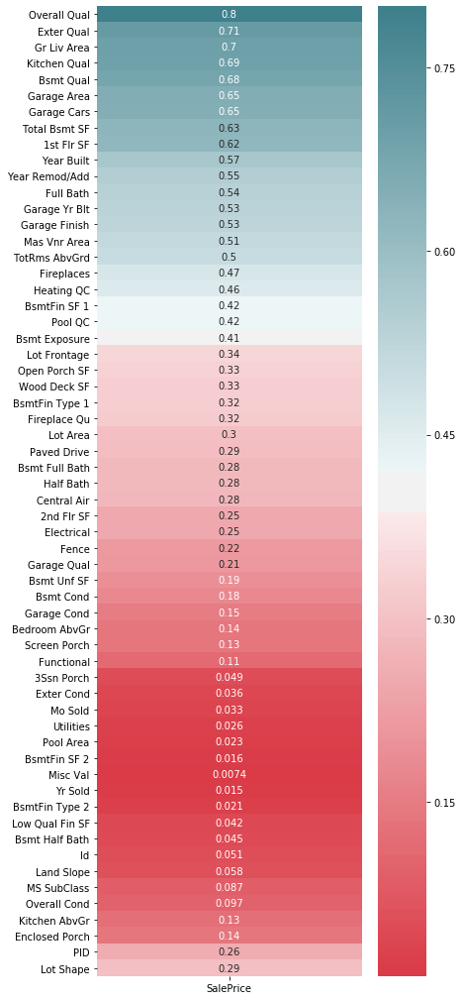

In [10]:
plt.figure(figsize=(6,18))
data_corr_2 = abs(train_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_2[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Drop all variance/ columns that have lower absolute correlation of 0.5, except for Nominal data

In [11]:
X_train_df = train_df.drop(['Lot Shape','BsmtFin Type 2','Bsmt Cond','Utilities','Garage Cond','Exter Cond', 'Fence', 'Bsmt Exposure','Enclosed Porch', 'Kitchen AbvGr', 'Overall Cond', 'MS SubClass', 'Low Qual Fin SF', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Yr Sold', 'Misc Val', 'BsmtFin SF 2', 'Pool Area', 'Mo Sold', 'Exter Cond', '3Ssn Porch', 'Screen Porch', 'Bedroom AbvGr', 'Garage Cond', 'Bsmt Unf SF', '2nd Flr SF', 'Half Bath', 'Bsmt Full Bath', 'Paved Drive', 'Lot Area', 'Fireplace Qu', 'Wood Deck SF', 'Open Porch SF', 'Lot Frontage', 'Bsmt Exposure', 'Pool QC', 'BsmtFin SF 1', 'Heating QC', 'Fireplaces'], axis=1)

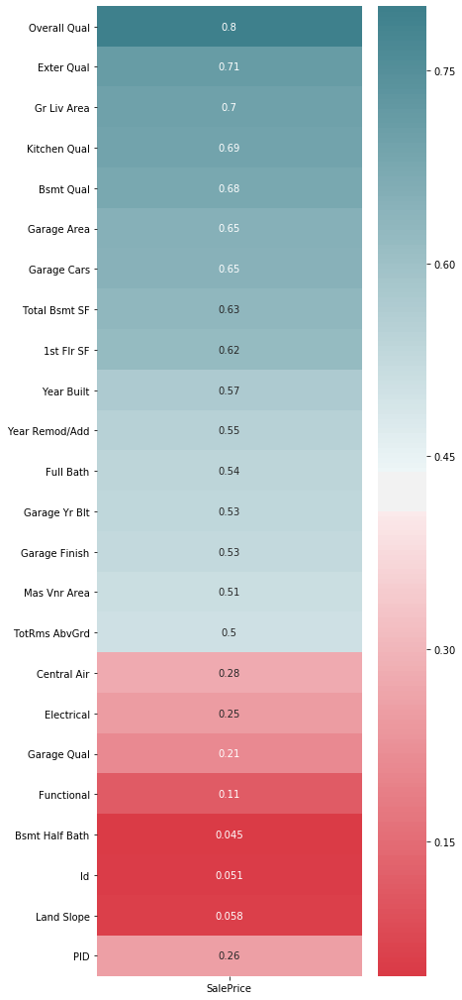

In [12]:
plt.figure(figsize=(6,18))
data_corr_2 = abs(X_train_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_2[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

In [13]:
X_nom_train_df = X_train_df.drop(['PID','MS Zoning','Roof Style','Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Street', 'Alley', 'Land Contour', 'Lot Config','Neighborhood', 'Condition 1', 'Condition 2', 'Bldg Type', 'House Style', 'Foundation', 'Heating', 'Central Air', 'Garage Type', 'Misc Feature','Sale Type'], axis=1)

In [14]:
sns.pairplot(X_nom_train_df, height = 10)

C:\Users\Umar\Anaconda3\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\Umar\Anaconda3\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


### Eliminate the Nominal Categories

Find Neighborhood - Correlation to Sale Price

In [15]:
neighb_dummy_df = pd.get_dummies(X_train_df[['Neighborhood','SalePrice']], drop_first=True)
neighb_dummy_df.shape

(2051, 28)

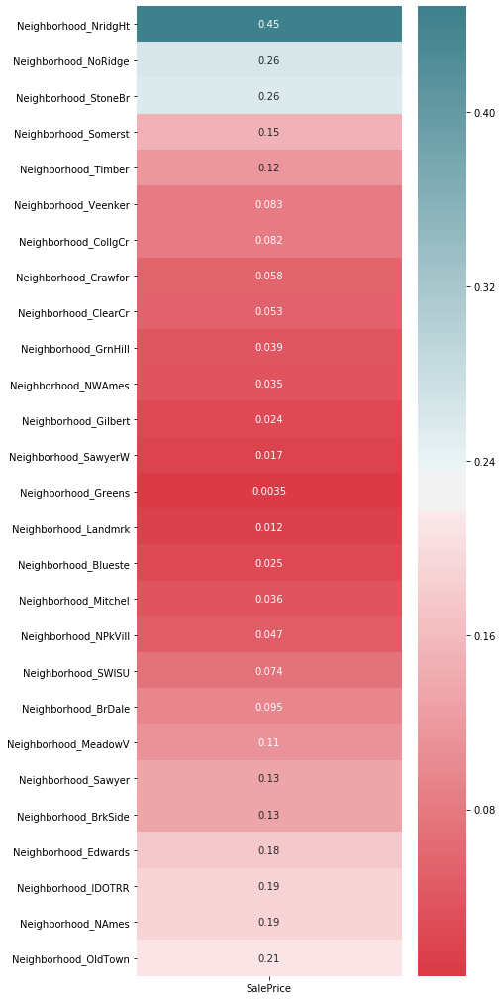

In [16]:
plt.figure(figsize=(6,18))
data_corr_neighb = abs(neighb_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_neighb[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Nridgeht has the highest absolute corelation in the entire category with ratio of 0.45. Due to low correlation it will not be used as a feature

Find PID - Correlation to Sale Price

In [17]:
PID_dummy_df = pd.get_dummies(X_train_df[['PID','SalePrice']], drop_first=True)
PID_dummy_df.shape

(2051, 2)

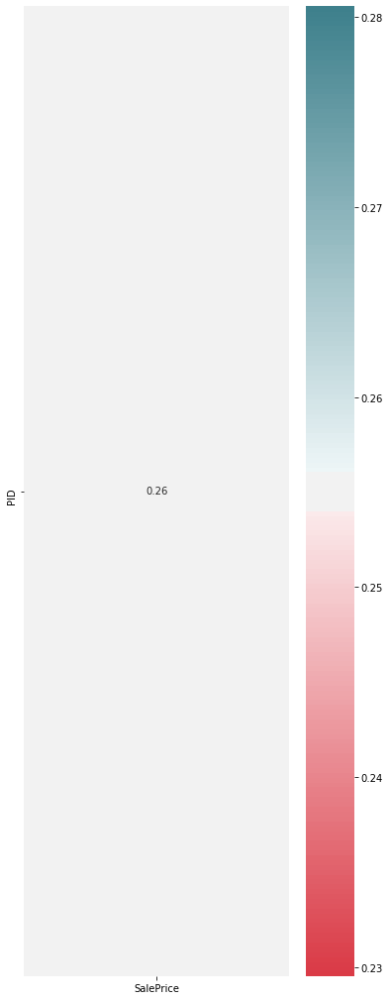

In [18]:
plt.figure(figsize=(6,18))
data_corr_PID = abs(PID_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_PID[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

In [19]:
X_train_df['PID'].unique

<bound method Series.unique of 0       533352170
1       531379050
2       535304180
3       916386060
4       906425045
          ...    
2046    921126030
2047    905377130
2048    909253010
2049    535179160
2050    527162130
Name: PID, Length: 2051, dtype: int64>

PID has the same unique identity as number of rows thus it is not required as a feature.

Find MS Zoning - Correlation to Sale Price

In [20]:
MSZ_dummy_df = pd.get_dummies(X_train_df[['MS Zoning','SalePrice']], drop_first=True)
MSZ_dummy_df.shape

(2051, 7)

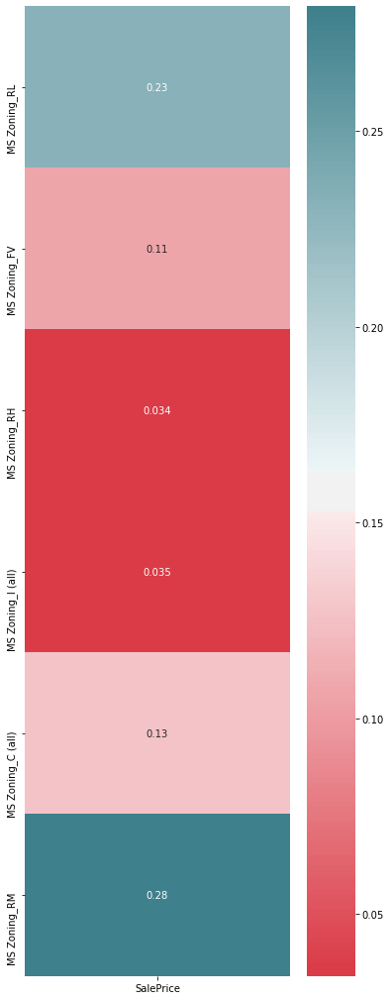

In [21]:
plt.figure(figsize=(6,18))
data_corr_MSZ = abs(MSZ_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_MSZ[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

MS_Zoning_RM has the highest absolute corelation in the entire category with ratio of 0.28. Thus it is not valid as a feature.

Find Roof Style - Correlation to Sale Price

In [22]:
ROFS_dummy_df = pd.get_dummies(X_train_df[['Roof Style','SalePrice']], drop_first=True)
ROFS_dummy_df.shape

(2051, 6)

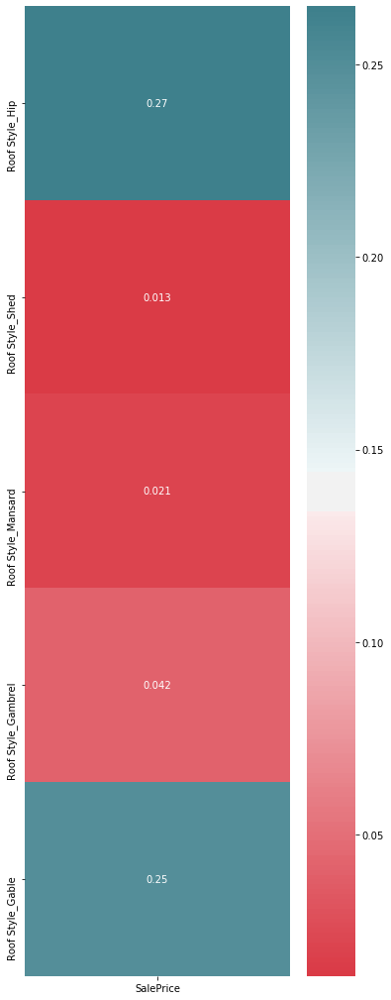

In [23]:
plt.figure(figsize=(6,18))
data_corr_ROFS = abs(ROFS_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_ROFS[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Roof Style_Hip has the highest absolute corelation in the entire category with ratio of 0.27

Find Roof Style - Correlation to Sale Price

In [24]:
ROFM_dummy_df = pd.get_dummies(X_train_df[['Roof Matl','SalePrice']], drop_first=True)
ROFM_dummy_df.shape

(2051, 6)

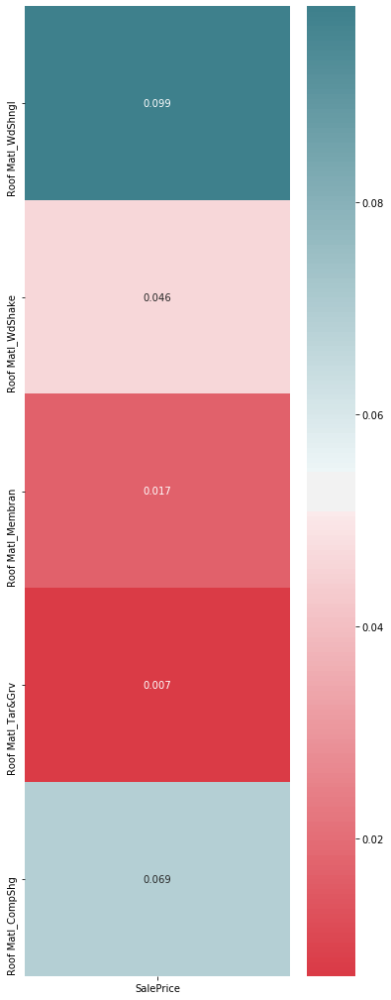

In [25]:
plt.figure(figsize=(6,18))
data_corr_ROFM = abs(ROFM_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_ROFM[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Roof Matl_WdShg has the highest absolute corelation in the entire category with ratio of 0.099. Due to low correlation it will not be use as a feature.

Find Exterior 1 - Correlation to Sale Price

In [26]:
EXT1_dummy_df = pd.get_dummies(X_train_df[['Exterior 1st','SalePrice']], drop_first=True)
EXT1_dummy_df.shape

(2051, 15)

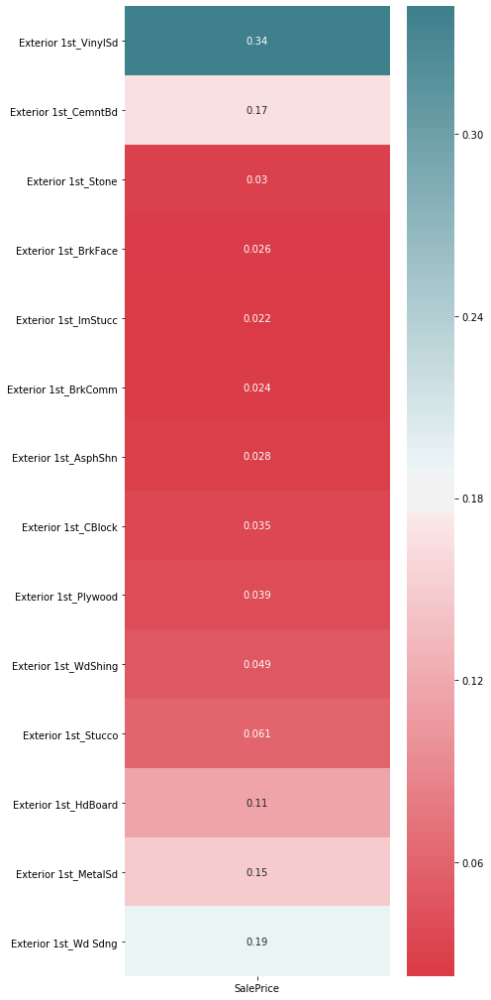

In [27]:
plt.figure(figsize=(6,18))
data_corr_EXT1 = abs(EXT1_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_EXT1[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Exterior 1st_VinylSd has the highest absolute corelation in the entire category with ratio of 0.34. Due to low correlation it will not be use as a feature.

Find Exterior 2nd - Correlation to Sale Price

In [28]:
EXT2_dummy_df = pd.get_dummies(X_train_df[['Exterior 2nd','SalePrice']], drop_first=True)
EXT2_dummy_df.shape

(2051, 15)

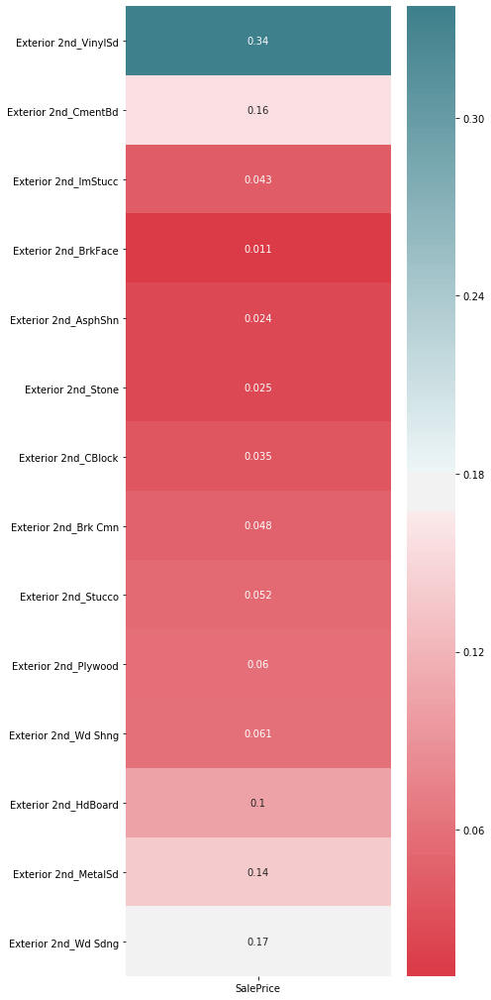

In [29]:
plt.figure(figsize=(6,18))
data_corr_EXT2 = abs(EXT2_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_EXT2[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Exterior 2nd_VinylSd has the highest absolute corelation in the entire category with ratio of 0.34. Due to low correlation it will not be use as a feature.

Find Mas Vnr Type - Correlation to Sale Price

In [30]:
MaV_dummy_df = pd.get_dummies(X_train_df[['Mas Vnr Type','SalePrice']], drop_first=True)
MaV_dummy_df.shape

(2051, 4)

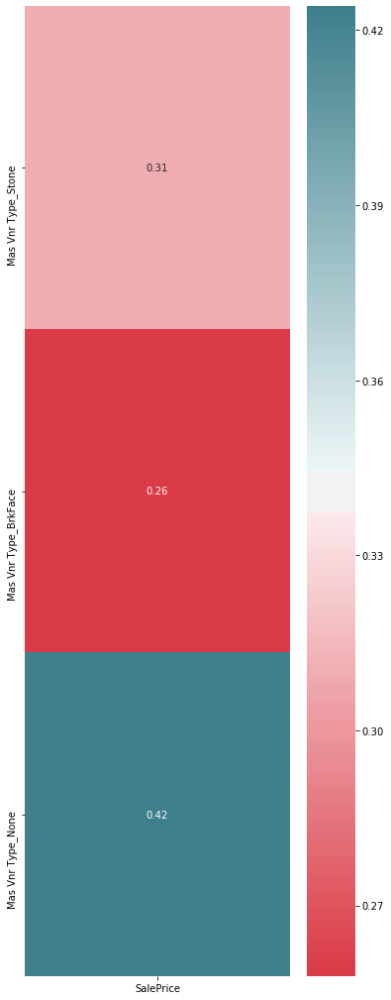

In [31]:
plt.figure(figsize=(6,18))
data_corr_MaV = abs(MaV_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_MaV[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Mas Vnr Type_None has the highest absolute corelation in the entire category with ratio of 0.42. Due to low correlation it will not be use as a feature.

Find Street - Correlation to Sale Price

In [32]:
St_dummy_df = pd.get_dummies(X_train_df[['Street','SalePrice']], drop_first=True)
St_dummy_df.shape

(2051, 2)

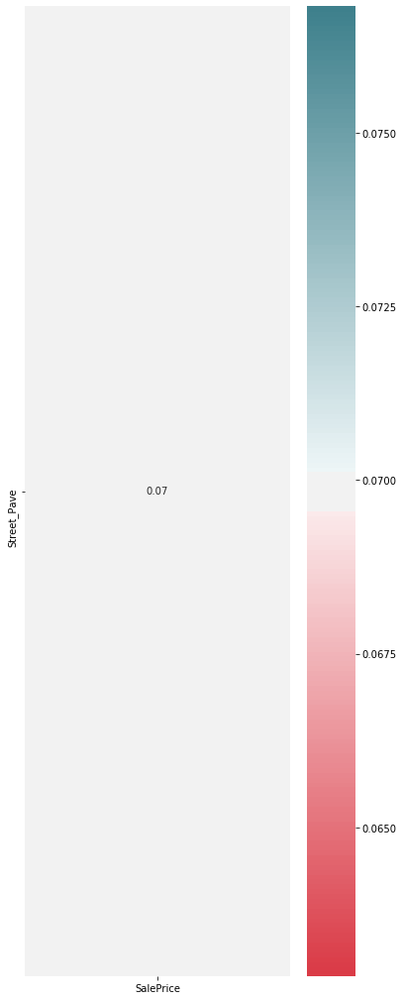

In [33]:
plt.figure(figsize=(6,18))
data_corr_St = abs(St_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_St[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Street has the highest absolute corelation in the entire category with ratio of 0.07, since all values are the same it produces a very low correlation. Due to low correlation it will not be use as a feature.

Find Alley - Correlation to Sale Price

In [34]:
St_dummy_Al = pd.get_dummies(X_train_df[['Alley','SalePrice']], drop_first=True)
St_dummy_Al.shape

(2051, 2)

Alley has the highest absolute corelation in the entire category with ratio of 0.07 . Due to low correlation it will not be use as a feature.

Find Land Contour - Correlation to Sale Price

In [35]:
LandCon_dummy_df = pd.get_dummies(X_train_df[['Land Contour','SalePrice']], drop_first=True)
LandCon_dummy_df.shape

(2051, 4)

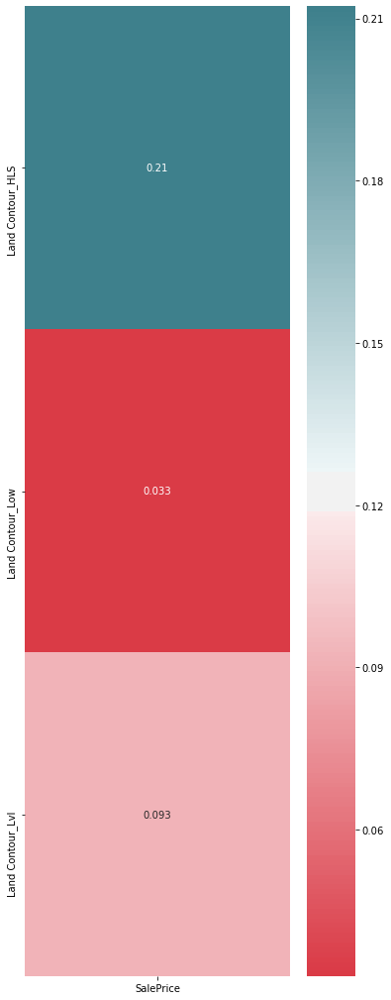

In [36]:
plt.figure(figsize=(6,18))
data_corr_LandCon = abs(LandCon_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_LandCon[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Land Contour has the highest absolute corelation in the entire category with ratio of 0.21 . Due to low correlation it will not be use as a feature.

Find Lot Config - Correlation to Sale Price

In [37]:
LotCon_dummy_df = pd.get_dummies(X_train_df[['Lot Config','SalePrice']], drop_first=True)
LotCon_dummy_df.shape

(2051, 5)

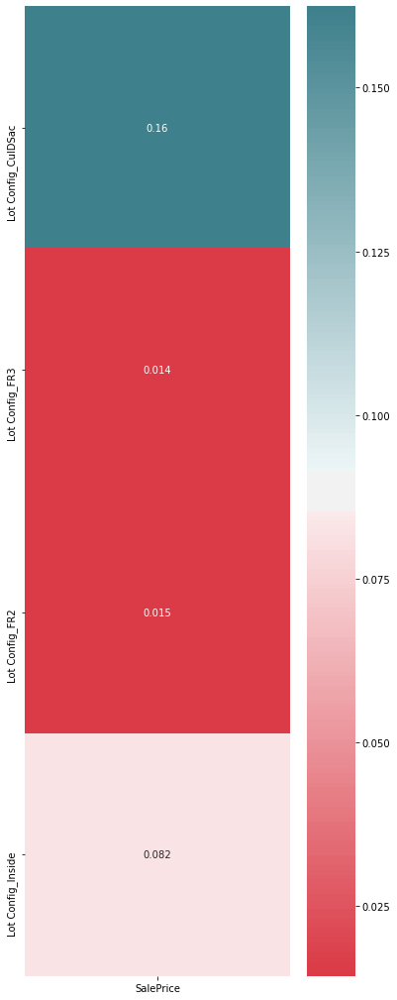

In [38]:
plt.figure(figsize=(6,18))
data_corr_LotCon = abs(LotCon_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_LotCon[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Lot Config has the highest absolute corelation in the entire category with ratio of 0.16 . Due to low correlation it will not be use as a feature.

Find Condition 1 - Correlation to Sale Price

In [39]:
Cond1_dummy_df = pd.get_dummies(X_train_df[['Condition 1','SalePrice']], drop_first=True)
Cond1_dummy_df.shape

(2051, 9)

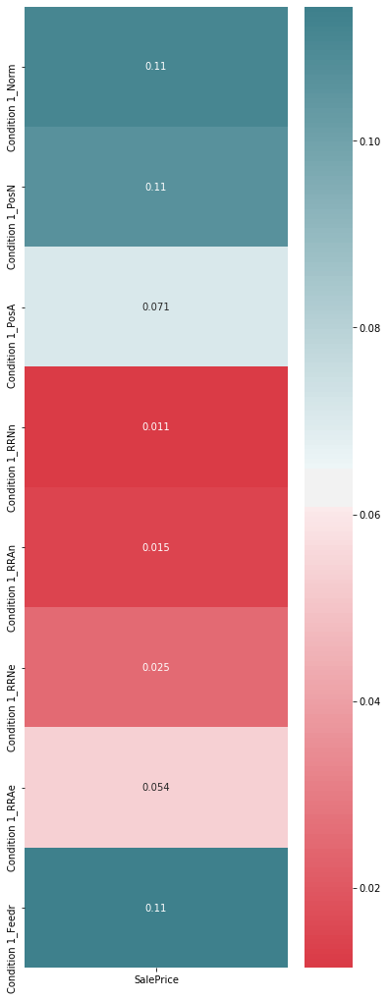

In [40]:
plt.figure(figsize=(6,18))
data_corr_Cond1 = abs(Cond1_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_Cond1[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Condition 1 has the highest absolute corelation in the entire category with ratio of 0.11 . Due to low correlation it will not be use as a feature.

Find Condition 2 - Correlation to Sale Price

In [41]:
Cond2_dummy_df = pd.get_dummies(X_train_df[['Condition 2','SalePrice']], drop_first=True)
Cond2_dummy_df.shape

(2051, 8)

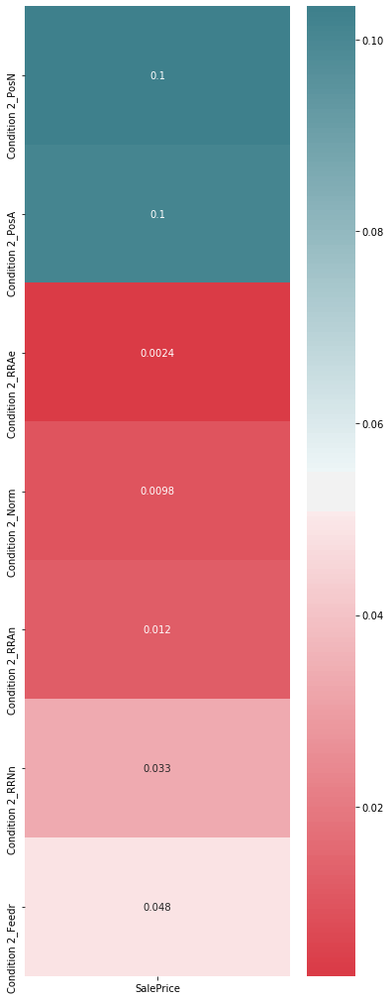

In [42]:
plt.figure(figsize=(6,18))
data_corr_Cond2 = abs(Cond2_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_Cond2[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Condition 2 has the highest absolute corelation in the entire category with ratio of 0.1 . Due to low correlation it will not be use as a feature.

Find Bldg Type - Correlation to Sale Price

In [43]:
BType_dummy_df = pd.get_dummies(X_train_df[['Bldg Type','SalePrice']], drop_first=True)
BType_dummy_df.shape

(2051, 5)

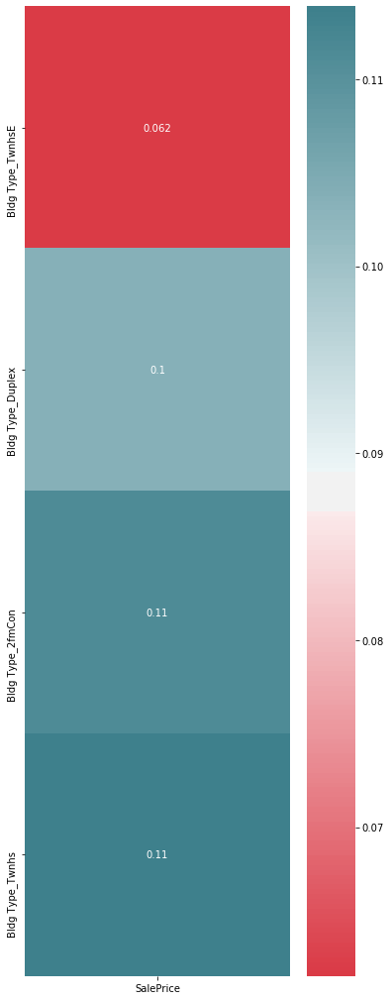

In [44]:
plt.figure(figsize=(6,18))
data_corr_BType = abs(BType_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_BType[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Bldg Type has the highest absolute corelation in the entire category with ratio of 0.11 . Due to low correlation it will not be use as a feature.

Find House Style - Correlation to Sale Price

In [45]:
HStyl_dummy_df = pd.get_dummies(X_train_df[['House Style','SalePrice']], drop_first=True)
HStyl_dummy_df.shape

(2051, 8)

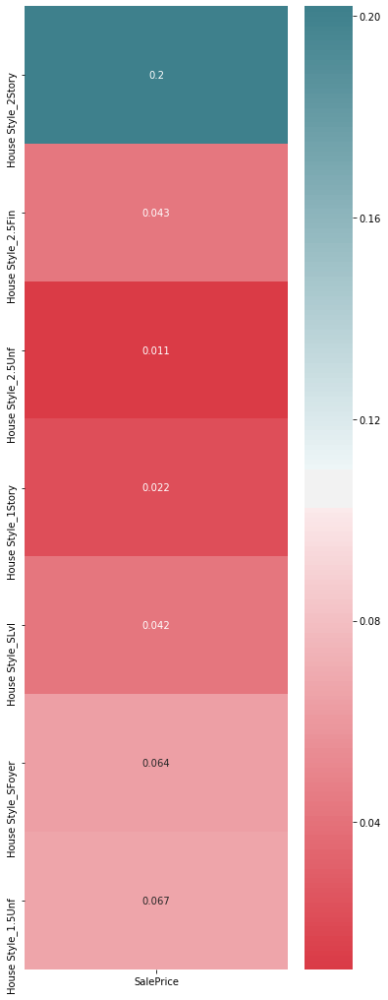

In [46]:
plt.figure(figsize=(6,18))
data_corr_HStyl = abs(HStyl_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_HStyl[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

House Style has the highest absolute corelation in the entire category with ratio of 0.2 . Due to low correlation it will not be use as a feature.

Find Foundation - Correlation to Sale Price

In [47]:
Foundt_dummy_df = pd.get_dummies(X_train_df[['Id','Foundation','SalePrice']], drop_first=True)
Foundt_dummy_df.shape

(2051, 7)

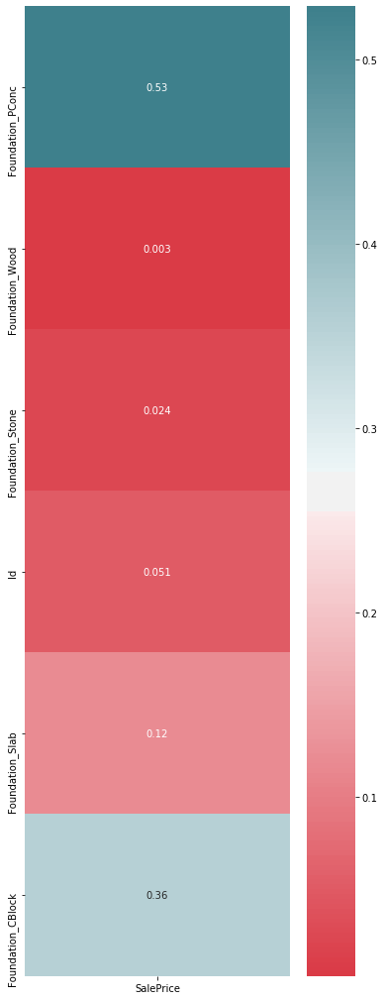

In [48]:
plt.figure(figsize=(6,18))
data_corr_Foundt = abs(Foundt_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_Foundt[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Foundation_Pconc has the highest absolute corelation in the entire category with ratio of 0.53 . As it is > 0.5 correlation it will be use as a feature.

Find Heating - Correlation to Sale Price

In [49]:
Heat_dummy_df = pd.get_dummies(X_train_df[['Heating','SalePrice']], drop_first=True)
Heat_dummy_df.shape

(2051, 5)

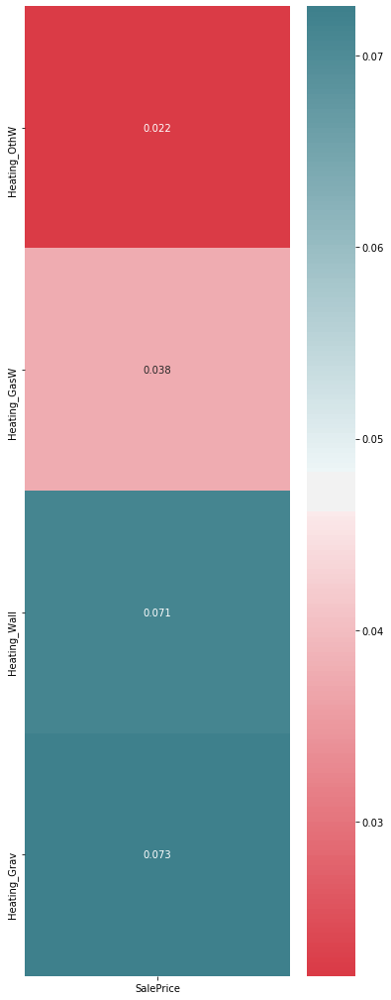

In [50]:
plt.figure(figsize=(6,18))
data_corr_Heat = abs(Heat_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_Heat[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Heating has the highest absolute corelation in the entire category with ratio of 0.073 . Due to low correlation it will not be use as a feature.

Find Central Air - Correlation to Sale Price

In [51]:
CenA_dummy_df = pd.get_dummies(X_train_df[['Central Air','SalePrice']], drop_first=True)
CenA_dummy_df.shape

(2051, 2)

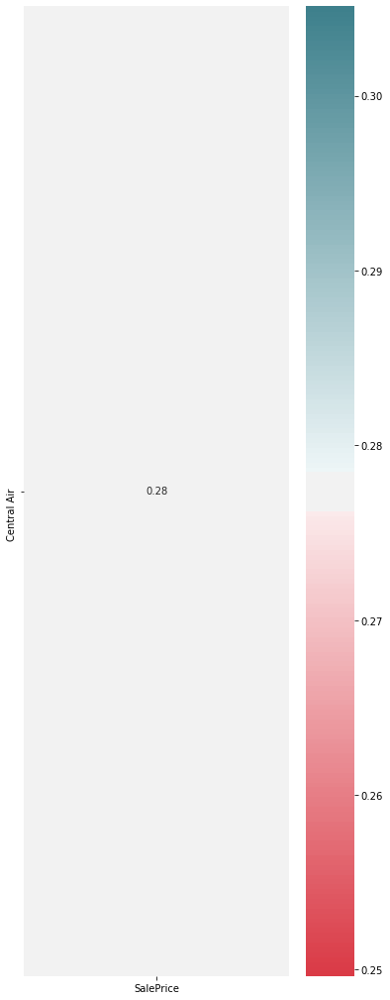

In [52]:
plt.figure(figsize=(6,18))
data_corr_CenA = abs(CenA_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_CenA[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Central Air has the highest absolute corelation in the entire category with ratio of 0.28. Due to low correlation it will not be use as a feature.

Find Garage Type - Correlation to Sale Price

In [53]:
GarT_dummy_df = pd.get_dummies(X_train_df[['Garage Type','SalePrice']], drop_first=True)
GarT_dummy_df.shape

(2051, 6)

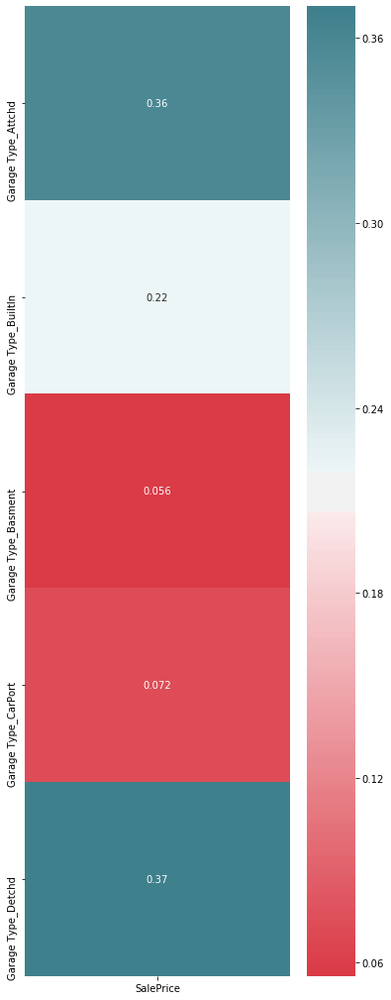

In [54]:
plt.figure(figsize=(6,18))
data_corr_GarT = abs(GarT_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_GarT[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Garage Type has the highest absolute corelation in the entire category with ratio of 0.37 . Due to low correlation it will not be use as a feature.

Find Misc Feature - Correlation to Sale Price

In [55]:
MiscF_dummy_df = pd.get_dummies(X_train_df[['Misc Feature','SalePrice']], drop_first=True)
MiscF_dummy_df.shape

(2051, 5)

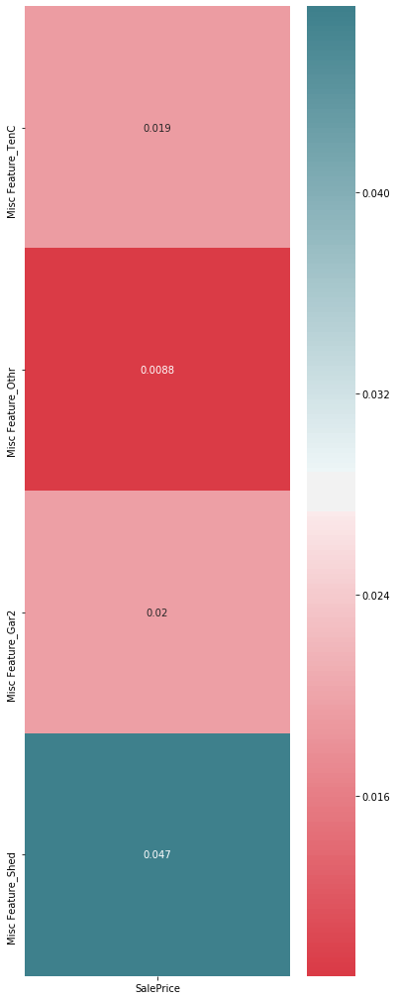

In [56]:
plt.figure(figsize=(6,18))
data_corr_MiscF = abs(MiscF_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_MiscF[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Misc Feature has the highest absolute corelation in the entire category with ratio of 0.36 . Due to low correlation it will not be use as a feature.

Find Sale Type - Correlation to Sale Price

In [57]:
SalT_dummy_df = pd.get_dummies(X_train_df[['Sale Type','SalePrice']], drop_first=True)
SalT_dummy_df.shape

(2051, 9)

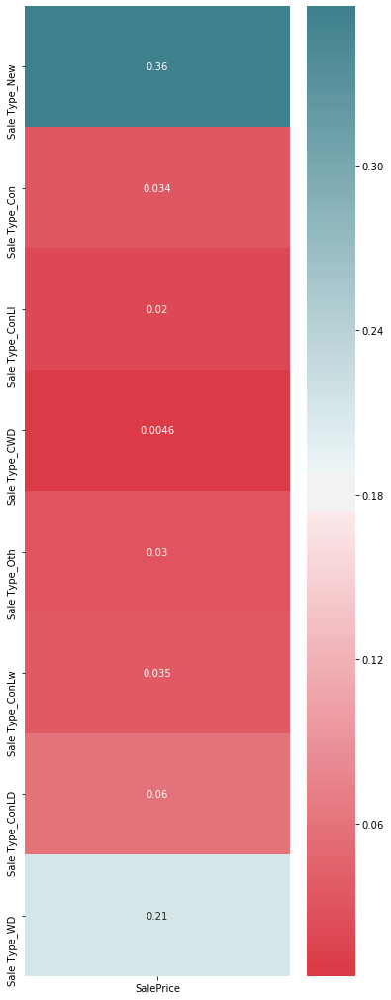

In [58]:
plt.figure(figsize=(6,18))
data_corr_SalT = abs(SalT_dummy_df.corr()[['SalePrice']].sort_values('SalePrice',ascending = False))
sns.heatmap(data_corr_SalT[1:], annot = True, cmap=sns.diverging_palette(730, 930, n=200) )

Sale Type has the highest absolute corelation in the entire category with ratio of 0.21 . Due to low correlation it will not be use as a feature.

Find Sale Condition is missing from data thus it is not used

# 4. Delete All uneccesary columns/ features

In [59]:
X_train_df_2 = X_train_df.drop(['PID', 'MS Zoning','Roof Style','Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Street', 'Alley', 'Land Contour', 'Lot Config','Neighborhood', 'Condition 1', 'Condition 2', 'Bldg Type', 'House Style', 'Foundation', 'Heating', 'Central Air', 'Garage Type', 'Misc Feature','Sale Type'], axis =1)

In [60]:
X_train_df_2.shape

(2051, 23)

In [61]:
Foundt_dummy_df.head()

,Id,SalePrice,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood
0,109,130500,1,0,0,0,0
1,544,220000,0,1,0,0,0
2,153,109000,1,0,0,0,0
3,318,174000,0,1,0,0,0
4,255,138500,0,1,0,0,0


In [62]:
X_Foundt_dummy_df = Foundt_dummy_df.drop(['SalePrice', 'Foundation_CBlock', 'Foundation_Slab', 'Foundation_Stone', 'Foundation_Wood'],axis = 1)

In [63]:
X_Foundt_dummy_df.head()

,Id,Foundation_PConc
0,109,0
1,544,1
2,153,0
3,318,1
4,255,1


In [64]:
#Merge dataset to have Foundation column as variance to predict Y-hat and removing 'Id' column
Clean_train_df = pd.merge(X_Foundt_dummy_df, X_train_df_2, on ='Id')
Clean_train_df.drop(['Id'],axis=1, inplace = True)
Clean_train_df.shape

(2051, 23)

## 4.2 Check and remove Nan Values

In [65]:
#Checks for Nan/Null Values
Clean_train_df.isnull().sum().sort_values(ascending = False)

Garage Finish       114
Garage Yr Blt       114
Garage Qual         114
Bsmt Qual            55
Mas Vnr Area         22
Bsmt Half Bath        2
Garage Area           1
Garage Cars           1
Total Bsmt SF         1
SalePrice             0
Land Slope            0
Overall Qual          0
Year Built            0
Year Remod/Add        0
Exter Qual            0
Gr Liv Area           0
Electrical            0
1st Flr SF            0
Full Bath             0
Kitchen Qual          0
TotRms AbvGrd         0
Functional            0
Foundation_PConc      0
dtype: int64

In [66]:
#Drops all Nan/Null values
N_Clean_train_df = Clean_train_df.dropna(how='any')
N_Clean_train_df.shape

(1870, 23)

In [67]:
#Checks for remaining Null/Nan Values
N_Clean_train_df.isnull().sum().sort_values(ascending = False)

SalePrice           0
1st Flr SF          0
Land Slope          0
Overall Qual        0
Year Built          0
Year Remod/Add      0
Mas Vnr Area        0
Exter Qual          0
Bsmt Qual           0
Total Bsmt SF       0
Electrical          0
Gr Liv Area         0
Garage Qual         0
Bsmt Half Bath      0
Full Bath           0
Kitchen Qual        0
TotRms AbvGrd       0
Functional          0
Garage Yr Blt       0
Garage Finish       0
Garage Cars         0
Garage Area         0
Foundation_PConc    0
dtype: int64

# 5. Linear Regression

## 5.1 Identify X & y

In [68]:
#Creating X and y
X = N_Clean_train_df.loc[:,N_Clean_train_df.columns != 'SalePrice']
X.shape

(1870, 22)

In [69]:
y = N_Clean_train_df[ 'SalePrice']
y.head()

0    130500
1    220000
2    109000
3    174000
4    138500
Name: SalePrice, dtype: int64

## 5.3 Test Split

In [70]:
#Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## 5.4 Scale

In [71]:
ss = StandardScaler()
ss.fit(X_train)
X_train_scaled = ss.transform(X_train)
X_test_scaled = ss.transform(X_test)
X.shape

(1870, 22)

In [72]:
X_train_scaled.shape

(1309, 22)

## 5.3 The Linear & The Elastic Band

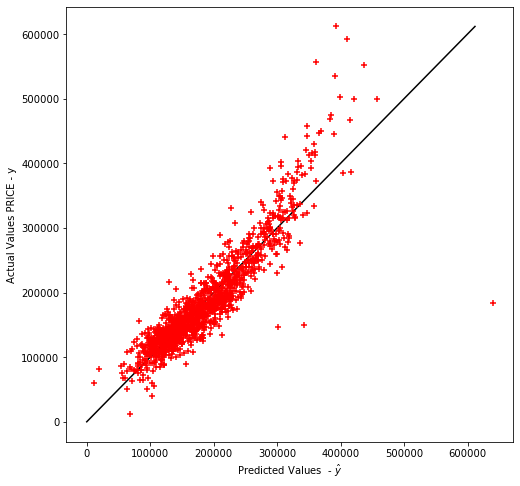

score:  0.8283796348163756


In [73]:
lr = linear_model.LinearRegression()
model = lr.fit(X_train_scaled, y_train)

predictions  =  model.predict(X_train_scaled)
score        =  model.score(X_train_scaled, y_train)

# Plot the model
plt.figure(figsize=(8,8))
plt.scatter(predictions, y_train, s=30, c='r', marker='+', zorder=10)
plt.xlabel("Predicted Values  - $\hat{y}$")
plt.ylabel("Actual Values PRICE - y")

plt.plot([0, np.max(y)], [0, np.max(y)], c = 'k')

plt.show()

print("score: ", score)

In [74]:
l1_ratios = np.linspace(0.01, 1.0, 25)

optimal_enet = ElasticNetCV(l1_ratio=l1_ratios, n_alphas=100, cv=10,
                            verbose=1)
optimal_enet.fit(X_train_scaled, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

ElasticNetCV(alphas=None, copy_X=True, cv=10, eps=0.001, fit_intercept=True,
             l1_ratio=array([0.01   , 0.05125, 0.0925 , 0.13375, 0.175  , 0.21625, 0.2575 ,
       0.29875, 0.34   , 0.38125, 0.4225 , 0.46375, 0.505  , 0.54625,
       0.5875 , 0.62875, 0.67   , 0.71125, 0.7525 , 0.79375, 0.835  ,
       0.87625, 0.9175 , 0.95875, 1.     ]),
             max_iter=1000, n_alphas=100, n_jobs=None, normalize=False,
             positive=False, precompute='auto', random_state=None,
             selection='cyclic', tol=0.0001, verbose=1)

In [75]:
enet = ElasticNet(alpha=optimal_enet.alpha_, l1_ratio=optimal_enet.l1_ratio_)
enet_scores = cross_val_score(enet, X_train_scaled, y_train, cv=10)
print(enet)
print(enet_scores)

ElasticNet(alpha=298.73798218670765, copy_X=True, fit_intercept=True,
           l1_ratio=1.0, max_iter=1000, normalize=False, positive=False,
           precompute=False, random_state=None, selection='cyclic', tol=0.0001,
           warm_start=False)
[0.87053502 0.84511825 0.79021196 0.87397579 0.87681416 0.85279304
 0.88769588 0.86943332 0.53760941 0.81463729]


In [76]:
enet.fit(X_train_scaled, y_train)

ElasticNet(alpha=298.73798218670765, copy_X=True, fit_intercept=True,
           l1_ratio=1.0, max_iter=1000, normalize=False, positive=False,
           precompute=False, random_state=None, selection='cyclic', tol=0.0001,
           warm_start=False)

In [77]:
enet.predict(X_train_scaled)

array([116332.9172904 , 126544.15093288, 301149.79339353, ...,
       181738.57796974, 202106.40438143, 228564.10237476])

In [78]:
enet_scores.mean()

0.8218824113661007

The score from Elastic band and linear regression is somewhat close. Seeing that the linear regression has a R^2 closer to 1 thus we shall use linear regression

### Generate Coeficients

In [79]:
lr.fit(X_train_scaled, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [80]:
lr.coef_

array([ -154.30298269, -4969.74359474, 16018.19580266,  3879.96650443,
        5309.50837009,  5211.47735694,  6722.31907717,  9505.91849815,
       10474.12756105,   548.48330023,  3400.74905947, 19143.53070145,
       -1383.55831644, -4227.82164707,  7233.45413189,  1593.05680841,
        4102.39137337, -8107.91412075,  4048.54485433,   -51.89872382,
        9859.23850965,  2587.21117693])

In [81]:
lr.score(X_train_scaled, y_train)

0.8283796348163756

In [82]:
lr.score(X_test_scaled, y_test)

0.7872728166323583

## Predict

In [83]:
y_hat = lr.predict(X_test_scaled)

In [84]:
print(y_hat)

[153557.58828056 121224.78303466 212399.459674   137785.4565102
 121386.32751888 221777.13233366 142024.12219573 179661.9703397
  49518.73674582 185545.32228978 151696.5990989  216207.3896352
 215908.71143678 116372.30993407 120161.12457157 128445.12865601
 114023.28267311 131099.3133551  109111.71659878 208348.07819338
 406298.57609663 174177.78925522 257272.80726783 252795.91149753
 154122.77210395 108426.11355169 271314.30909582 345047.54473245
 133817.41612082 139490.32969038 333511.47553019 215630.94784052
 146321.58423117 204865.65384867 138735.66258796 148550.12765425
 168689.75846589 232306.82493662 185813.72226074 187558.029313
 221210.73717808 109302.62011484 175339.99775657 310259.76597072
 140907.72847739 136761.15095458 126433.50824413 149641.22784047
 258865.96364825 165876.41676675 116604.02327046 212232.54669542
 131855.77954052 221599.79410354 166265.2513764  278287.31188952
 149571.76846827 198248.29563978 237235.34318062 300141.86028408
 173453.16327794 169866.608753

In [85]:
print(y_test)

1869    177625
1640    119000
1016    215000
302     174500
455     119500
         ...  
1868    176000
261      86900
603     144000
1917    210000
1520    137500
Name: SalePrice, Length: 561, dtype: int64


## 5.2 R^2 and accuracy

In [86]:
scores = cross_val_score(lr,X_train_scaled,y_train, cv=22, n_jobs = -1)
scores

array([0.86359697, 0.86462629, 0.89138109, 0.82605887, 0.81018853,
       0.85816746, 0.68715875, 0.86815389, 0.88414311, 0.87469944,
       0.86787901, 0.88844474, 0.81898577, 0.90022903, 0.8774184 ,
       0.89009418, 0.8598645 , 0.75030582, 0.2384265 , 0.81788714,
       0.80443283, 0.83554153])

In [87]:
scores.mean()

0.8171674476769719

In [88]:
cross_val_score(LinearRegression(), X_train_scaled, y_train, cv=5)

array([0.86307116, 0.83324416, 0.86064815, 0.87877316, 0.63397546])

In [89]:
cross_val_score(lr, X_train_scaled, y_train, cv=5).mean()

0.8139424210625356

In [90]:
lr.score(X_train_scaled,y_train)

0.8283796348163756

In [91]:
lr.score(X_test_scaled,y_test)

0.7872728166323583

# Find the Sale Price/Y_hat for test.csv

In [92]:
#Lot Shape
predict_df.replace('Reg', 4, inplace= True)
predict_df.replace('IR1', 3, inplace= True)
predict_df.replace('IR2', 2, inplace= True)
predict_df.replace('IR3', 1, inplace= True)
#Utilities
predict_df.replace('AllPub', 4, inplace= True)
predict_df.replace('NoSewr', 3, inplace= True)
predict_df.replace('NoSeWa', 2, inplace= True)
predict_df.replace('ELO', 1, inplace= True)
#Land Slope
predict_df.replace('Gtl', 3, inplace= True)
predict_df.replace('Mod', 2, inplace= True)
predict_df.replace('Sev', 1, inplace= True)
#Exter Qual, Exter Cond, Bsmt Qual, Bsmt Cond, HeatingQC, KitchenQual, FireplaceQu, Garage Qual, Garage Cond, PoolQC
predict_df.replace('Ex', 5, inplace= True)
predict_df.replace('Gd', 4, inplace= True)
predict_df.replace('TA', 3, inplace= True)
predict_df.replace('Fa', 2, inplace= True)
predict_df.replace('Po', 1, inplace= True)
predict_df.replace('NA', 0, inplace= True)
#Bsmt Exposure
predict_df.replace('Av', 3, inplace= True)
predict_df.replace('Mn', 2, inplace= True)
predict_df.replace('No', 1, inplace= True)
predict_df.replace('NA', 0, inplace= True)
#BsmtFin Type 1, BsmtFinType 2
predict_df.replace('GLQ', 6, inplace= True)
predict_df.replace('ALQ', 5, inplace= True)
predict_df.replace('BLQ', 4, inplace= True)
predict_df.replace('Rec', 3, inplace= True)
predict_df.replace('LwQ', 2, inplace= True)
predict_df.replace('Unf', 1, inplace= True)
#Electrical
predict_df.replace('SBrkr', 5, inplace= True)
predict_df.replace('FuseA', 4, inplace= True)
predict_df.replace('FuseF', 3, inplace= True)
predict_df.replace('FuseP', 2, inplace= True)
predict_df.replace('Mix', 1, inplace= True)
#Functional
predict_df.replace('Typ', 8, inplace= True)
predict_df.replace('Min1', 7, inplace= True)
predict_df.replace('Min2', 6, inplace= True)
predict_df.replace('Mod', 5, inplace= True)
predict_df.replace('Maj1', 4, inplace= True)
predict_df.replace('Maj2', 3, inplace= True)
predict_df.replace('Sev', 2, inplace= True)
predict_df.replace('Sal', 1, inplace= True)
#Garage Finish
predict_df.replace('Fin', 3, inplace= True)
predict_df.replace('RFn', 2, inplace= True)
#Paved Drive
predict_df.replace('Y', 3, inplace= True)
predict_df.replace('P', 2, inplace= True)
predict_df.replace('N', 1, inplace= True)
#Fence
predict_df.replace('GdPrv', 4, inplace= True)
predict_df.replace('MnPrv', 3, inplace= True)
predict_df.replace('GdWo', 2, inplace= True)
predict_df.replace('MnWw', 1, inplace= True)


predict_df.head(10)

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,2658,902301120,190,RM,69.0,9142,Pave,Grvl,4,Lvl,4,Inside,3,OldTown,Norm,Norm,2fmCon,2Story,6,8,1910,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,3,2,Stone,2.0,3.0,1.0,1.0,0,1.0,0,1020,1020,GasA,4,1,2.0,908,1020,0,1928,0,0,2,0,4,2,2,9,8,0,NaN,Detchd,1910.0,1.0,1,440,1.0,1.0,3,0,60,112,0,0,0,NaN,NaN,NaN,0,4,2006,WD,0
1,2718,905108090,90,RL,NaN,9662,Pave,NaN,3,Lvl,4,Inside,3,Sawyer,Norm,Norm,Duplex,1Story,5,4,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,3,3,CBlock,4.0,3.0,1.0,1.0,0,1.0,0,1967,1967,GasA,3,3,5.0,1967,0,0,1967,0,0,2,0,6,2,3,10,8,0,NaN,Attchd,1977.0,3.0,2,580,3.0,3.0,3,170,0,0,0,0,0,NaN,NaN,NaN,0,8,2006,WD,0
2,2414,528218130,60,RL,58.0,17104,Pave,NaN,3,Lvl,4,Inside,3,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,4,3,PConc,4.0,4.0,3.0,6.0,554,1.0,0,100,654,GasA,5,3,5.0,664,832,0,1496,1,0,2,1,3,1,4,7,8,1,4.0,Attchd,2006.0,2.0,2,426,3.0,3.0,3,100,24,0,0,0,0,NaN,NaN,NaN,0,9,2006,New,0
3,1989,902207150,30,RM,60.0,8520,Pave,NaN,4,Lvl,4,Inside,3,OldTown,Norm,Norm,1Fam,1Story,5,6,1923,2006,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,4,3,CBlock,3.0,3.0,1.0,1.0,0,1.0,0,968,968,GasA,3,3,5.0,968,0,0,968,0,0,1,0,2,1,3,5,8,0,NaN,Detchd,1935.0,1.0,2,480,2.0,3.0,1,0,0,184,0,0,0,NaN,NaN,NaN,0,7,2007,WD,0
4,625,535105100,20,RL,NaN,9500,Pave,NaN,3,Lvl,4,Inside,3,NAmes,Norm,Norm,1Fam,1Story,6,5,1963,1963,Gable,CompShg,Plywood,Plywood,BrkFace,247.0,3,3,CBlock,4.0,3.0,1.0,4.0,609,1.0,0,785,1394,GasA,4,3,5.0,1394,0,0,1394,1,0,1,1,3,1,3,6,8,2,4.0,Attchd,1963.0,2.0,2,514,3.0,3.0,3,0,76,0,0,185,0,NaN,NaN,NaN,0,7,2009,WD,0
5,333,923228370,160,RM,21.0,1890,Pave,NaN,4,Lvl,4,Inside,3,MeadowV,Norm,Norm,TwnhsE,2Story,4,6,1972,1972,Gable,CompShg,CemntBd,CmentBd,None,0.0,3,3,CBlock,3.0,3.0,1.0,3.0,294,1.0,0,252,546,GasA,3,3,5.0,546,546,0,1092,0,0,1,1,3,1,3,5,8,0,NaN,Attchd,1972.0,1.0,1,286,3.0,3.0,3,0,0,64,0,0,0,NaN,NaN,NaN,0,6,2010,WD,0
6,1327,902427150,20,RM,52.0,8516,Pave,NaN,4,Lvl,4,Inside,3,OldTown,Norm,Norm,1Fam,1Story,4,6,1958,2006,Gable,CompShg,MetalSd,MetalSd,None,0.0,3,3,CBlock,3.0,3.0,1.0,1.0,0,1.0,0,869,869,GasA,3,3,5.0,1093,0,0,1093,0,0,1,0,2,1,3,5,8,0,NaN,Detchd,1959.0,1.0,1,308,3.0,3.0,3,0,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,0
7,858,907202130,20,RL,NaN,9286,Pave,NaN,3,Lvl,4,CulDSac,2,CollgCr,Norm,Norm,1Fam,1Story,5,7,1977,1989,Gable,CompShg,HdBoard,Plywood,None,0.0,3,3,CBlock,4.0,4.0,3.0,5.0,196,1.0,0,1072,1268,GasA,3,3,5.0,1268,0,0,1268,0,0,1,1,3,1,4,5,8,0,NaN,Detchd,1978.0,1.0,1,252,3.0,3.0,3,173,0,0,0,0,0,NaN,NaN,NaN,0,10,2009,WD,0
8,95,533208090,160,FV,39.0,3515,Pave,Pave,4,Lvl,4,Inside,3,Somerst,Norm,Norm,TwnhsE,2Story,7,5,2004,2004,Gable,CompShg,VinylSd,VinylSd,None,0.0,4,3,PConc,4.0,3.0,1.0,1.0,0,1.0,0,840,840,GasA,5,3,5.0,840,840,0,1680,0,0,2,1,2,1,4,3,8,0,NaN,Attchd,2004.0,2.0,2,588,3.0,3.0,3,0,111,0,0,0,0,NaN,NaN,NaN,0,1,2010,WD,0
9,1568,914476010,20,RL,75.0,10125,Pave,NaN,4,Lvl,4,Inside,3,Mitchel,Norm,Norm,1Fam,1Story,6,6,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,3,3,CBlock,3.0,3.0,1.0,5.0,641,2.0,279,276,1196,GasA,3,3,5.0,1279,0,0,1279,0,1,2,0,3,1,3,6,8,2,2.0,Detchd,1

In [93]:
Foundt_dummyp_df = pd.get_dummies(predict_df[['Id','Foundation','SalePrice']], drop_first=True)
X_Foundt_dummyp_df = Foundt_dummyp_df.drop(['SalePrice', 'Foundation_CBlock', 'Foundation_Slab', 'Foundation_Stone', 'Foundation_Wood'],axis = 1)
X_predict_df = predict_df.drop(['Lot Shape','BsmtFin Type 2','Bsmt Cond','Utilities','Garage Cond','Exter Cond', 'Fence', 'Bsmt Exposure','Enclosed Porch', 'Kitchen AbvGr', 'Overall Cond', 'MS SubClass', 'Low Qual Fin SF', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Yr Sold', 'Misc Val', 'BsmtFin SF 2', 'Pool Area', 'Mo Sold', 'Exter Cond', '3Ssn Porch', 'Screen Porch', 'Bedroom AbvGr', 'Garage Cond', 'Bsmt Unf SF', '2nd Flr SF', 'Half Bath', 'Bsmt Full Bath', 'Paved Drive', 'Lot Area', 'Fireplace Qu', 'Wood Deck SF', 'Open Porch SF', 'Lot Frontage', 'Bsmt Exposure', 'Pool QC', 'BsmtFin SF 1', 'Heating QC', 'Fireplaces'], axis=1)
X_predict_df_2 = X_predict_df.drop(['PID', 'MS Zoning','Roof Style','Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Street', 'Alley', 'Land Contour', 'Lot Config','Neighborhood', 'Condition 1', 'Condition 2', 'Bldg Type', 'House Style', 'Foundation', 'Heating', 'Central Air', 'Garage Type', 'Misc Feature','Sale Type'], axis =1)
Clean_predict_df = pd.merge(X_Foundt_dummyp_df, X_predict_df_2, on ='Id')
Clean_predict_df.head()

,Id,Foundation_PConc,Land Slope,Overall Qual,Year Built,Year Remod/Add,Mas Vnr Area,Exter Qual,Bsmt Qual,Total Bsmt SF,Electrical,1st Flr SF,Gr Liv Area,Bsmt Half Bath,Full Bath,Kitchen Qual,TotRms AbvGrd,Functional,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,SalePrice
0,2658,0,3,6,1910,1950,0.0,3,2.0,1020,2.0,908,1928,0,2,2,9,8,1910.0,1.0,1,440,1.0,0
1,2718,0,3,5,1977,1977,0.0,3,4.0,1967,5.0,1967,1967,0,2,3,10,8,1977.0,3.0,2,580,3.0,0
2,2414,1,3,7,2006,2006,0.0,4,4.0,654,5.0,664,1496,0,2,4,7,8,2006.0,2.0,2,426,3.0,0
3,1989,0,3,5,1923,2006,0.0,4,3.0,968,5.0,968,968,0,1,3,5,8,1935.0,1.0,2,480,2.0,0
4,625,0,3,6,1963,1963,247.0,3,4.0,1394,5.0,1394,1394,0,1,3,6,8,1963.0,2.0,2,514,3.0,0


In [94]:
Clean_predict_df.isna().sum()

Id                   0
Foundation_PConc     0
Land Slope           0
Overall Qual         0
Year Built           0
Year Remod/Add       0
Mas Vnr Area         1
Exter Qual           0
Bsmt Qual           25
Total Bsmt SF        0
Electrical           1
1st Flr SF           0
Gr Liv Area          0
Bsmt Half Bath       0
Full Bath            0
Kitchen Qual         0
TotRms AbvGrd        0
Functional           0
Garage Yr Blt       45
Garage Finish       45
Garage Cars          0
Garage Area          0
Garage Qual         45
SalePrice            0
dtype: int64

In [95]:
avg=round(np.mean(Clean_predict_df['Garage Yr Blt']))
print(avg)

1977


In [96]:
#Replace 
Clean_predict_df['Garage Yr Blt'].fillna(value=(avg), inplace=True)
Clean_predict_df.fillna(value=0, inplace=True)

Clean_predict_df.isna().sum()

Id                  0
Foundation_PConc    0
Land Slope          0
Overall Qual        0
Year Built          0
Year Remod/Add      0
Mas Vnr Area        0
Exter Qual          0
Bsmt Qual           0
Total Bsmt SF       0
Electrical          0
1st Flr SF          0
Gr Liv Area         0
Bsmt Half Bath      0
Full Bath           0
Kitchen Qual        0
TotRms AbvGrd       0
Functional          0
Garage Yr Blt       0
Garage Finish       0
Garage Cars         0
Garage Area         0
Garage Qual         0
SalePrice           0
dtype: int64

In [97]:
Xp = Clean_predict_df.loc[:,Clean_predict_df.columns != 'SalePrice']

In [98]:
Xp.head()

,Id,Foundation_PConc,Land Slope,Overall Qual,Year Built,Year Remod/Add,Mas Vnr Area,Exter Qual,Bsmt Qual,Total Bsmt SF,Electrical,1st Flr SF,Gr Liv Area,Bsmt Half Bath,Full Bath,Kitchen Qual,TotRms AbvGrd,Functional,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual
0,2658,0,3,6,1910,1950,0.0,3,2.0,1020,2.0,908,1928,0,2,2,9,8,1910.0,1.0,1,440,1.0
1,2718,0,3,5,1977,1977,0.0,3,4.0,1967,5.0,1967,1967,0,2,3,10,8,1977.0,3.0,2,580,3.0
2,2414,1,3,7,2006,2006,0.0,4,4.0,654,5.0,664,1496,0,2,4,7,8,2006.0,2.0,2,426,3.0
3,1989,0,3,5,1923,2006,0.0,4,3.0,968,5.0,968,968,0,1,3,5,8,1935.0,1.0,2,480,2.0
4,625,0,3,6,1963,1963,247.0,3,4.0,1394,5.0,1394,1394,0,1,3,6,8,1963.0,2.0,2,514,3.0


In [99]:
Xp1=Xp.drop(['Id'],axis =1)

In [100]:
Xp1.shape

(879, 22)

In [101]:
Xp1.dtypes

Foundation_PConc      uint8
Land Slope            int64
Overall Qual          int64
Year Built            int64
Year Remod/Add        int64
Mas Vnr Area        float64
Exter Qual            int64
Bsmt Qual           float64
Total Bsmt SF         int64
Electrical          float64
1st Flr SF            int64
Gr Liv Area           int64
Bsmt Half Bath        int64
Full Bath             int64
Kitchen Qual          int64
TotRms AbvGrd         int64
Functional            int64
Garage Yr Blt       float64
Garage Finish       float64
Garage Cars           int64
Garage Area           int64
Garage Qual         float64
dtype: object

In [102]:
#ss.fit(Xp)
Xp_scaled = ss.transform(Xp1)

In [103]:
Xp['SalePrice'] = lr.predict(Xp_scaled)
Xp.head()

,Id,Foundation_PConc,Land Slope,Overall Qual,Year Built,Year Remod/Add,Mas Vnr Area,Exter Qual,Bsmt Qual,Total Bsmt SF,Electrical,1st Flr SF,Gr Liv Area,Bsmt Half Bath,Full Bath,Kitchen Qual,TotRms AbvGrd,Functional,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,SalePrice
0,2658,0,3,6,1910,1950,0.0,3,2.0,1020,2.0,908,1928,0,2,2,9,8,1910.0,1.0,1,440,1.0,121161.776749
1,2718,0,3,5,1977,1977,0.0,3,4.0,1967,5.0,1967,1967,0,2,3,10,8,1977.0,3.0,2,580,3.0,219497.689819
2,2414,1,3,7,2006,2006,0.0,4,4.0,654,5.0,664,1496,0,2,4,7,8,2006.0,2.0,2,426,3.0,188278.414669
3,1989,0,3,5,1923,2006,0.0,4,3.0,968,5.0,968,968,0,1,3,5,8,1935.0,1.0,2,480,2.0,133966.820910
4,625,0,3,6,1963,1963,247.0,3,4.0,1394,5.0,1394,1394,0,1,3,6,8,1963.0,2.0,2,514,3.0,190295.211061


In [105]:
sub_kaggle = Xp[['Id','SalePrice']]
sub_kaggle.to_csv("predicted_SalePrice.csv", index=False, header=True)